# Fast.ai Lesson 1

I am working through the `fast.ai` lessons found at the [Fast Book](https://github.com/fastai/fastbook) Github repo.

There are several good recommendations for where to perform the exercises for free with a GPU, but I wanted to do some stuff with sensitive workplace data, so I needed a local installation.  And we use Windows and .NET, so my primary development system is Windows.  Using CUDA in WSL or VMs is fairly difficult, so I'm using the base installation of Windows.  (This of course assumes that you have an NVidia GPU with CUDA installed.  See NVidia for instructions on installing CUDA.)

### Local Installation

To make things easier, I've made a local installation of `conda` and `pytorch` and friends, so I can run the notebook locally, but able to uninstall it easily if necessary.

```
pwsh.exe -Command Start-Process .\Anaconda3-2021.11-Windows-x86_64.exe -ArgumentList "/S","/InstallationType=JustMe","/AddToPath=0","/RegisterPython=0","/D=$(PWD)\anaconda" -Wait
```

This should install Anaconda into the directory you're in, into the `anaconda` subdirectory.

To test the notebook server runs properly, try the following command.

```
.\anaconda\condabin\conda.bat run jupyter notebook --no-browser --ip=0.0.0.0 --port=9999 --config=.\jupyter_notebook_config.json
```

Visit `https://localhost:9999` to see the password prompt.

The `jupyter_notebook_config.json` file is configured to provide password access using the password "Deep Learning from Scratch".  You should change the password to the hash per the instructions at [Securing a Notebook Server](https://jupyter-notebook.readthedocs.io/en/stable/public_server.html#securing-a-notebook-server)

Close the browser and exit the notebook server with `^C`.

### Install Pytorch and friends

Use the installed conda command to install the necessary libraries used.

```
.\anaconda\condabin\conda install pytorch torchvision torchaudio cudatoolkit=11.3 -c pytorch
```


### Test Installation

Test that `pytorch` is available and can use the GPU.  Start the notebook server again:

```
.\anaconda\condabin\conda.bat run jupyter notebook --no-browser --ip=0.0.0.0 --port=9999 --config=.\jupyter_notebook_config.json
```

Open a new Python 3 notebook.  Verify that `pytorch` is available and can use the GPU as below.

In [1]:
import torch

In [2]:
torch.cuda.is_available()

True

## Training Examples for Cats

The following are the examples used for image classification for cats.  I've added beyond the examples in the books, testing various categories of cats in addition to non-cats.

In [3]:
from fastai.vision.all import *

In [5]:
path = untar_data(URLs.PETS)/'images'

In [10]:
def is_cat(x): return x[0].isupper()
dls = ImageDataLoaders.from_name_func(path, get_image_files(path), valid_pct=0.15, seed=69, label_func=is_cat, item_tfms=Resize(224))

Due to IPython and Windows limitation, python multiprocessing isn't available now.
So `number_workers` is changed to 0 to avoid getting stuck


In [11]:
learn = cnn_learner(dls, resnet34, metrics=error_rate)

In [12]:
learn.fine_tune(2)

epoch,train_loss,valid_loss,error_rate,time
0,0.143853,0.020823,0.006318,00:50


epoch,train_loss,valid_loss,error_rate,time
0,0.073467,0.010802,0.003610,00:55
1,0.028794,0.009675,0.004513,00:55


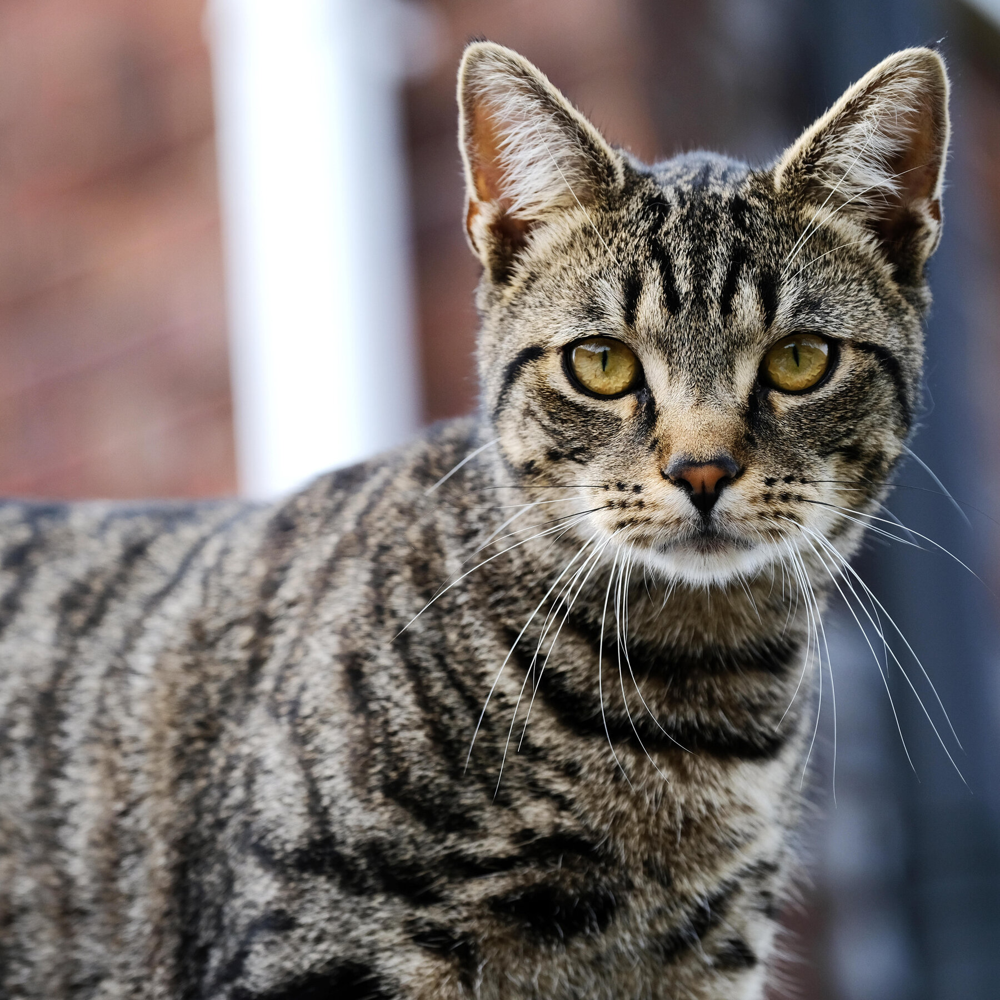

In [49]:
cat = PILImage.create('D:/Projects/fast.ai/cat_test.jpg')
cat

In [29]:
is_cat,_,prob = learn.predict(cat)

In [30]:
is_cat

'True'

In [31]:
prob

TensorBase([4.5977e-10, 1.0000e+00])

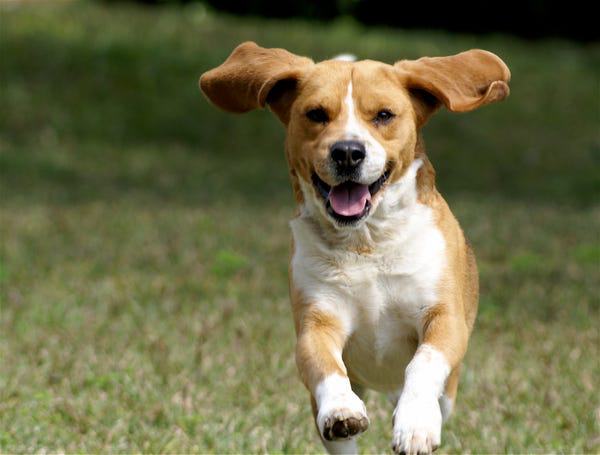

In [45]:
dog = PILImage.create('D:/Projects/fast.ai/dog_test.jpg')
dog

In [25]:
is_cat,_,prob = learn.predict(dog)

In [26]:
is_cat

'False'

In [27]:
prob

TensorBase([9.9999e-01, 5.8396e-06])

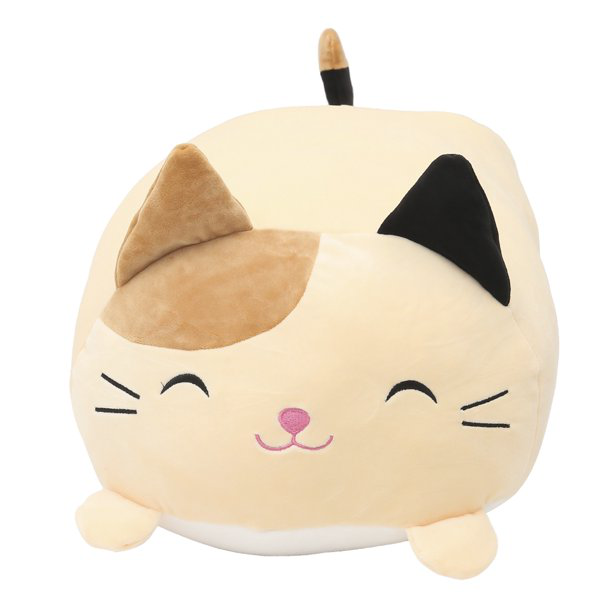

In [46]:
plush = PILImage.create('D:/Projects/fast.ai/cat_plush_test.jpg')
plush

In [33]:
is_cat,_,prob = learn.predict(plush)

In [34]:
is_cat

'True'

In [35]:
prob

TensorBase([0.2915, 0.7085])

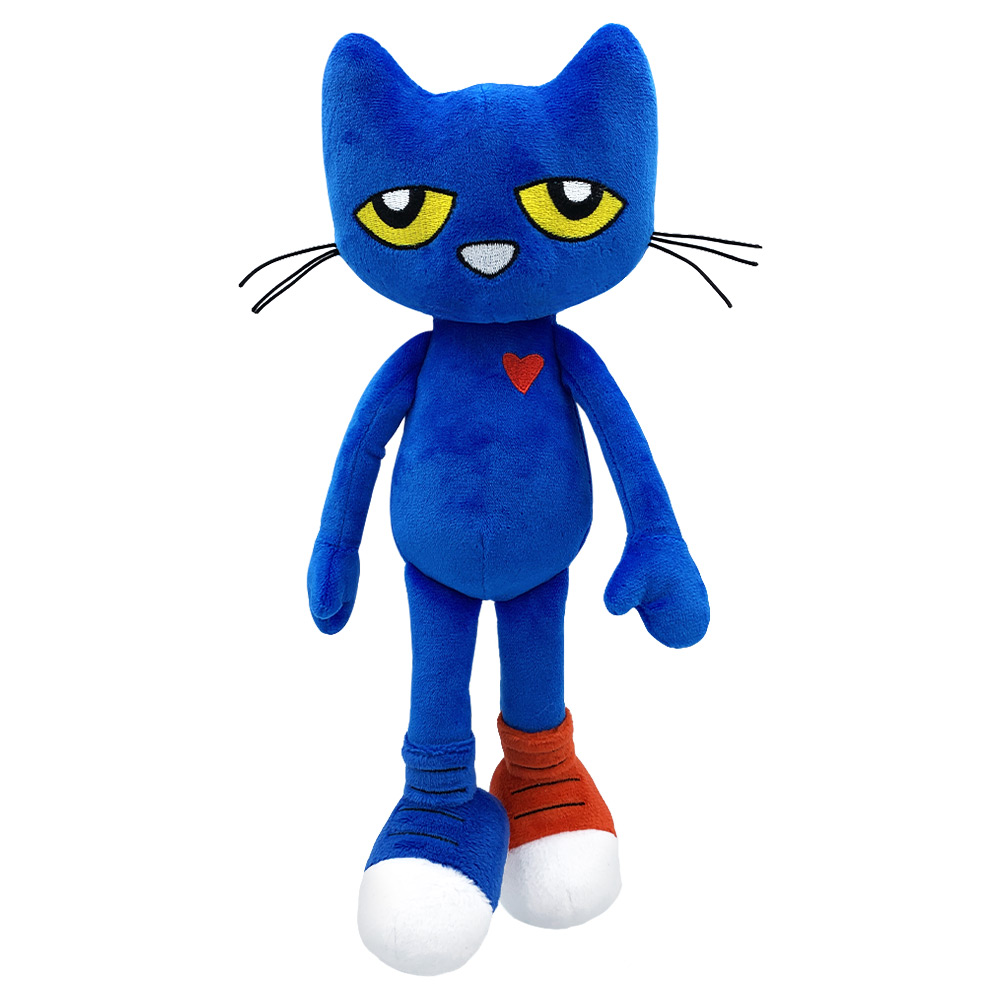

In [47]:
plush = PILImage.create('D:/Projects/fast.ai/cat_plush_test2.jpg')
plush

In [37]:
is_cat,_,prob = learn.predict(plush)

In [38]:
is_cat

'False'

In [39]:
prob

TensorBase([0.7043, 0.2957])

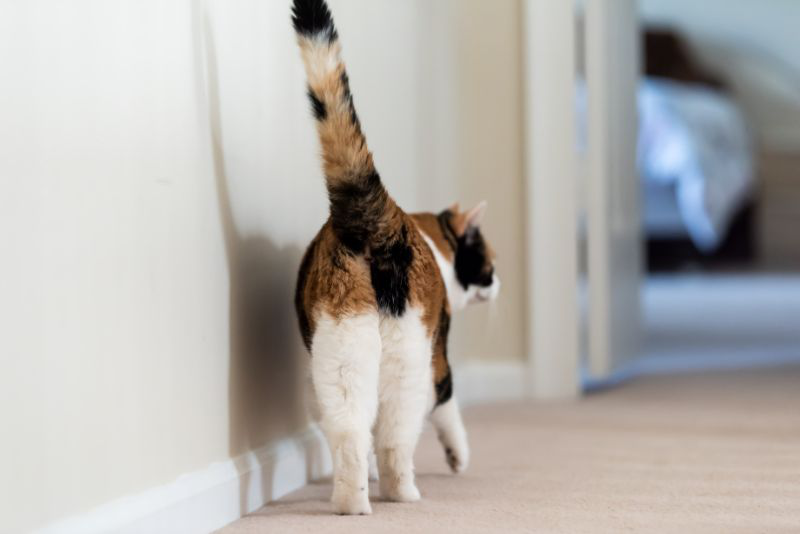

In [48]:
cat = PILImage.create('D:/Projects/fast.ai/cat_from_behind.jpg')
cat

In [41]:
is_cat,_,prob = learn.predict(cat)

In [42]:
is_cat

'False'

In [43]:
prob

TensorBase([0.5757, 0.4243])

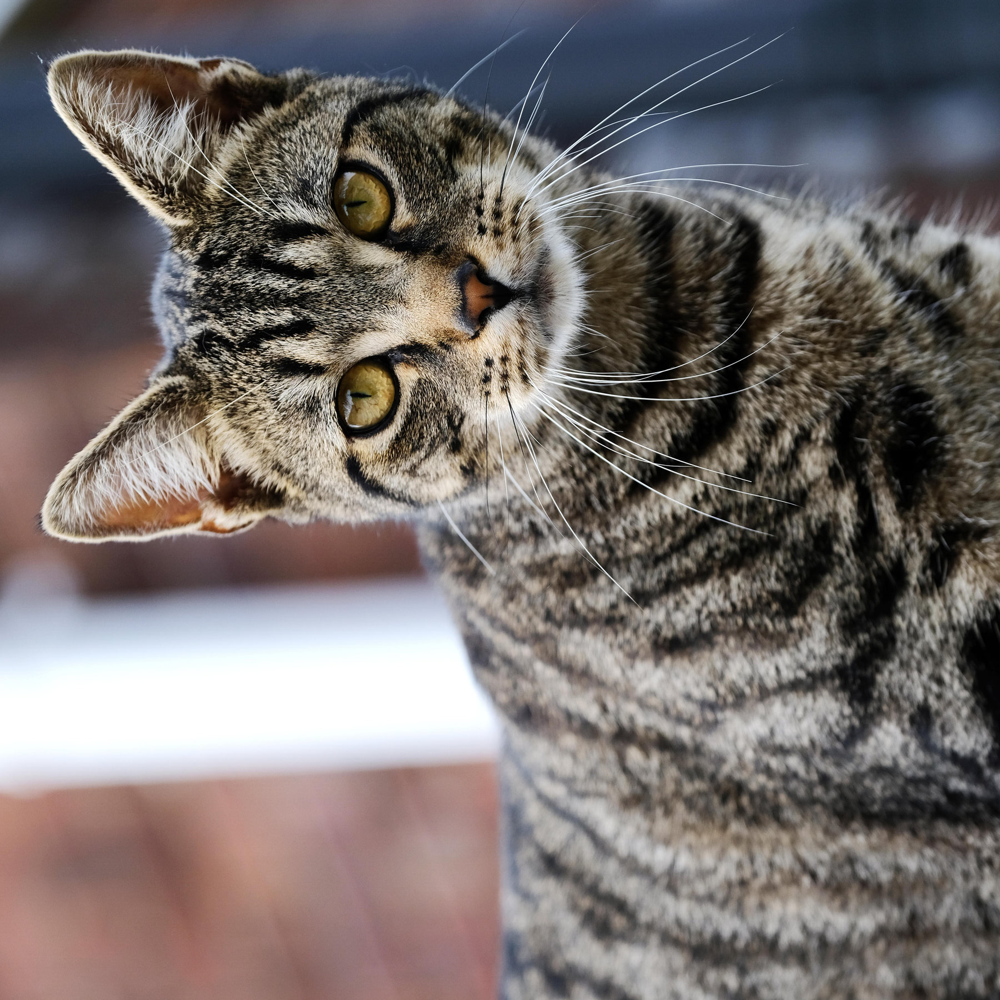

In [50]:
cat = PILImage.create('D:/Projects/fast.ai/cat_test.jpg')
cat.rotate(90)

In [51]:
is_cat,_,prob = learn.predict(cat)

In [52]:
is_cat

'True'

In [53]:
prob

TensorBase([4.5977e-10, 1.0000e+00])

We can see from the examples that the matching isn't perfect.  One of the plushes is an anthropomorphic cat (bipedal, but still very cat like), and it didn't identify it as a cat.  Whether that's correct or not is left as an opinion of the reader.

The cat from behind wasn't identified as a cat, though the probability was pretty high, 42% likely that it was.  This was higher than I thought it would be.

I was also surprised at how well it worked when the image was rotated.

## Remaining Exercises

Just for completeness, the remaining code segments are included as is, to show that the installation works and that similar results are achieved.

In [55]:
path = untar_data(URLs.CAMVID_TINY)
dls = SegmentationDataLoaders.from_label_func(
    path, bs=8, fnames = get_image_files(path/"images"),
    label_func = lambda o: path/'labels'/f'{o.stem}_P{o.suffix}',
    codes = np.loadtxt(path/'codes.txt', dtype=str)
)

learn = unet_learner(dls, resnet34)
learn.fine_tune(8)

Due to IPython and Windows limitation, python multiprocessing isn't available now.
So `number_workers` is changed to 0 to avoid getting stuck


D:\Projects\fast.ai\anaconda\lib\site-packages\torch\_tensor.py:1051: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  ret = func(*args, **kwargs)


epoch,train_loss,valid_loss,time
0,2.961876,4.058006,00:06


epoch,train_loss,valid_loss,time
0,2.059776,1.821326,00:01
1,1.726435,1.333086,00:01
2,1.507527,1.192726,00:01
3,1.351094,1.109907,00:01
4,1.207045,0.947887,00:01
5,1.084998,0.870757,00:01
6,0.987481,0.848686,00:01
7,0.911431,0.828768,00:01


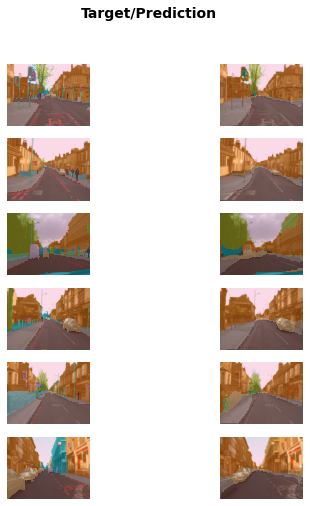

In [56]:
learn.show_results(max_n=6 , figsize=(7,8))

### Sentiment Analysis

Analyze movie reviews and then compare sentiments to phrases we feed it.  These weren't nearly as accurate as I was hoping.  It thinks that "This movie sucked!" is a positive example?

In [1]:
from fastai.text.all import *

dls = TextDataLoaders.from_folder(untar_data(URLs.IMDB), valid='test', bs=16)
learn = text_classifier_learner(dls, AWD_LSTM, drop_mult=0.5, metrics=accuracy)
learn.fine_tune(4, 1e-2)

Due to IPython and Windows limitation, python multiprocessing isn't available now.
So `number_workers` is changed to 0 to avoid getting stuck


epoch,train_loss,valid_loss,accuracy,time
0,0.490601,0.413796,0.816080,06:24


epoch,train_loss,valid_loss,accuracy,time
0,0.325990,0.251079,0.895960,10:35
1,0.252135,0.269229,0.882840,10:35
2,0.189188,0.187396,0.926640,10:30
3,0.133065,0.186851,0.932920,10:28


In [6]:
learn.predict("I really liked that movie!")

('pos', TensorText(1), TensorText([0.0087, 0.9913]))

In [8]:
learn.predict("I really disliked that movie.")

('pos', TensorText(1), TensorText([0.4788, 0.5212]))

In [12]:
learn.predict("That movie sucked!")

('pos', TensorText(1), TensorText([0.1567, 0.8433]))

In [10]:
learn.predict("I was ambivalent to that movie.")

('pos', TensorText(1), TensorText([0.3446, 0.6554]))

In [13]:
learn.predict("That movie was awful!")

('neg', TensorText(0), TensorText([0.9336, 0.0664]))

### Tabular Data

Well, this is discouraging. Since I'm hoping to use DL for tabular data sets, I was hoping for higher numbers.  Granted, the dataset is fairly small (I used this dataset in a project at Georgia Tech), so perhaps I shouldn't be too suprised at the accuracy relative to the image detection example.  

In [20]:
from fastai.tabular.all import *
path = untar_data(URLs.ADULT_SAMPLE)

dls = TabularDataLoaders.from_csv(path/'adult.csv', path=path, y_names="salary",
    cat_names = ['workclass', 'education', 'marital-status', 'occupation',
                 'relationship', 'race'],
    cont_names = ['age', 'fnlwgt', 'education-num'],
    procs = [Categorify, FillMissing, Normalize])

learn = tabular_learner(dls, metrics=accuracy)

In [21]:
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,accuracy,time
0,0.395811,0.370912,0.826321,00:04
1,0.364768,0.357338,0.831849,00:04
2,0.357140,0.350080,0.837224,00:04
3,0.348357,0.349179,0.836916,00:04


## Questionnaire Answers

Below are my answers to the questions asked at the end of Lesson 1.

**Q: Do you need these for deep learning?**

* Lots of math ~T~ / F
* Lots of data ~T~ / F
* Lots of expensive computers ~T~ / F
* A PhD ~T~ / F

In other words, you don't need any of these things to use deep learning.  However, I think that to truly understand it, you probably do need lots of math, and from other sources I've read, the more data the better, so I'd be comfortable with saying T to point 2.

**Q: Name five areas where deep learning is now the best in the world.**
    
Computer Vision, NLP or Natural Language Processing (including sentiment analysis and machine translation), Object Detection and Recognition in images (and even audio, when the audio is converted to visual representations), Recommendation Systems (and other tabular data types).

**Q: What was the name of the first device that was based on the principle of the artificial neuron?**

The Mark I Perceptron was named by Rosenblatt based on previous work done by McCullough and Pitts on an artificual neuron.

**Q: Based on the book of the same name, what are the requirements for parallel distributed processing (PDP)?**
    
The PDP book outlined components similar to the perceptrons, listed as:

* processing units
* state of activation
* output function for each unit
* connectivity between units
* propagation rule for propagating patterns of activities through the network of connectivities
* activation rule for combining the inputs impinging on a unit with the current state of that unit to produce an output for the unit
* learning rule whereby patterns of connectivity are modified by experience
* environment within which the system must operate

These are not called the same now in modern ANN vocabulary, but they are all present.

**Q: What is a GPU?**
    
A GPU is a processor with many cores that specializes in highly parallel operations. Each processor is not as sophisticated as 
those in a CPU, but they are optimized for SIMD type operations, in particular matrix multiplication that is used by DL.


**Q: Open a notebook and execute a cell containing: 1+1. What happens?**

It prints `2` in the Out section.

**Q: Follow through each cell of the stripped version of the notebook for this chapter. 
    Before executing each cell, guess what will happen.**
    
Done via the exercises above.

**Q: Why is it hard to use a traditional computer program to recognize images in a photo?**
    
Traditional programs are usually a sequence of precise instructions, more precise than we know 
ourselves how to perform.  As the book says "As any programmer can tell you, computers are giant morons, 
not giant brains."

**Q: What did Samuel mean by "weight assignment"?**

Weight assignment refers to the learning that the model will do by adjusting these assignments.  As it compares its predictions with the outputs, it will adjust the weights within the network to correct error and achieve better results.

**Q: What term do we normally use in deep learning for what Samuel called "weights"?**

The book says that it means "parameters" in today's vocabulary, but I'm not sure that covers everything.  NN work by updating the weights within the neurons through various means (most commonly back propagation).  However, the weights are updated by recalculating them from the parameters that are adjusted, so there is definitely something to do with the parameters.  I think.  Still going through this book.

**Q: Draw a picture that summarizes Samuel's view of a machine learning model.**

Below is the mermaid code to generate a flowchart that very simply diagrams what Samuel outlines according to the quote in the book:

```
graph TD
    A[Initial Weight Assign] --> B[Test Performance]
    B --> C{Is Loss Acceptable}
    C -->|Yes| D[Finished]
    C -->|No| E[Reassign Weights]
    E --> B
```

**Q: Why is it hard to understand why a deep learning model makes a particular prediction?**
    
Just as it is hard for us to understand our own cognition, a deep learning model becomes inscrutable over
several layers.

One reason in particular is that our visualization techniques don't scale well.

However, the section *What Our Image Recognizer Learned* does do a good job showing how an image detection can recognize patterns.

I imagine there is some sort of technique available for other formats of data, such as tabular, that might show which weights were the most important.  Almost like a decision tree visualization?

**Q: What is the name of the theorem that shows that a neural network can solve any mathematical problem to any level of accuracy?**
    
The Universal Approximation Theorem. The basic crux is that either an arbitrarily wide (nodes) or arbitrarily deep (layers) neural network can approximate to any arbitrary level any mathematical function.  Practically, this is true over a specific range of inputs.

**Q: What do you need in order to train a model?**

You need 3 things: 1) data, 2) computing power, and 3) time.  The more you have of any of these, generally the better your results will be.

Data is the fuel of deep learning.  Without it, there is nothing to learn.

Computing power (execution and memory) is the engine.  The more you have, the more you can pull, to use the engine analogy probably incorrectly.  More computing power allows more layers and more analysis on the model that you're building.

The more time you have, the more you can do with the data and computing power that you have.  Inversely, the more computing power you have, the less time you'll likely need.  Hence why we use GPUs in this course.

**Q: How could a feedback loop impact the rollout of a predictive policing model?**

Feedback loops reinforce what is already believed or known.  If you have erroneous assumptions, you tend to get erroneous predictions.  Garbage In, Garbage Out.

This could be bad for a predictive policing model. If it were to predict incorrectly, it would likely reinforce the biases that make the decisions incorrect, causing perhaps more egregiously incorrect decisions.

**Q: Do we always have to use 224×224-pixel images with the cat recognition model?**

No. 224 is used for historical reasons.  But larger images will likely give you more accurate predictions at the cost of more memory and longer compute times.

Q: What is the difference between classification and regression?

Classification refers to using discrete labels for values, such as boolean "Yes" and "No, or colors such as "Red", "Blue", etc.

Regression refers to using continuous numeric values, such as height, age, or income, but not discrete ones such as phone numbers.

**Q: What is a validation set? What is a test set? Why do we need them?**

A validation set is a subset of the data used to measure the performance of the training set, and then adjust the training set accordingly.  (This is done after the model is trained on the training set, usually by adjusting the parameters.)

A test set is data withheld during the entire training cycle, to measure the true ability of the model to generalize on data it's never seen.

Training data alone will lead to overfitting, so we use these sets to measure how well the model generalizes to data it's never seen before, the key to the model generating good predictions.

**Q: What will fastai do if you don't provide a validation set?**

It withholds 20% of the data randomly selected as the validation set.  "fastai defaults valid_pct to 0.2, so even if you forget, fastai will create a validation set for you!"

**Q: Can we always use a random sample for a validation set? Why or why not?**

No. Time series data requires locality of data to learn properly. Randomly pulling data out of time slots disjuncts this pattern and doesn't let the model learn properly.

For time series, it's best to use later times to validate or test the model.

**Q: What is overfitting? Provide an example.**

Overfitting is when a model has learned the test very well but fails to generalize and makes incorrect predictions on data.

An example might be our cat data set only predicting the cats its seen before and rejecting everything else.

**Q: What is a metric? How does it differ from "loss"?**

The metric is simply a measurement.  In the book's parlance, it is the method selected by the user to measure the model's performance.

The loss is the value of a certain function that the training regime tries to minimize.

The metric and loss are not often the same values.

**Q: How can pretrained models help?**

Pretrained models are already adjusted for a certain task, with weights that are much closer to the target than randomly initialized weights.

Otherwise, the training would have to spend time minimizing what the pretrained models already minimized.

Pretraining is not always the best option, but often a model trained for broadly similar tasks can shorten training times dramatically.

**Q: Are image models only useful for photos?**

No, but they are only useful for images.  In other words, to train them for other tasks, the data for those tasks has to be converted to an image.  The audio samples had to be converted to images, as well as the fraud detection mouse movemens and clicks.

**Q: What is an "architecture"?**
    
An architecture is the "functional form of the model", meaning its finalized weights and format, which can then be used to perform predictions.

**Q: What is the "head" of a model?**

The head is a set of randomized layers created by the `cnn_learner` to substitute for the highly specialized last layer present in a pretrained model.

**Q: What kinds of features do the early layers of a CNN find? How about the later layers?**

This is fascinating stuff.  Looking at the images produced, the first layers look for simply shapes or features, such as circles, lines, or colors.

Later layers combine these in interesting ways to start recoginizing complex shapes and color schemes and other combined attributes.

**Q: What is segmentation?**

Segmentation is recognizing elements of pictures rather than just predicting a single item from a picture.  It can work on a pixel level.


**Q: What is `y_range` used for? When do we need it?**

`y_range` is used to tell `fastai` what the range of a continuous prediction value may take.

**Q: What are "hyperparameters"?**

These are parameters used to jump into hyperspace.  The Millenium Falcon used these to navigate star systems when smuggling and to evade the Empire.

Also, hyperparameters are the "parameters above parameters", used to control how the learning takes place when training.  It can be number of layers, etc.

**Q: What's the best way to avoid failures when using AI in an organization?**

Don't use it. :D

According to our text, using validation and test sets properly is the best way to avoid failure.

I also think frequent checking and verifying of the ongoing predictions is necessary, perhaps to balance bias and otherwise make sure that you understand what the AI is providing.

Also, having someone who can explain why the AI is doing what it does is valuable.  This might be someone on staff or someone who an organization consults.

## Further Research

**Q: Why is a GPU useful for deep learning? How is a CPU different, and why is it less effective for deep learning?**

This is a decent analogy, taken from https://towardsdatascience.com/what-is-a-gpu-and-do-you-need-one-in-deep-learning-718b9597aa0dhttps://towardsdatascience.com/what-is-a-gpu-and-do-you-need-one-in-deep-learning-718b9597aa0d:

If you consider a CPU as a Maserati, a GPU can be considered as a big truck.

The CPU (Maserati) can fetch small amounts of packages (3 -4 passengers) in the RAM quickly whereas a GPU(the truck) is slower but can fetch large amounts of memory (~20 passengers) in one turn.

The GPU has a ton of cores, that are each slower and can do less than a CPU core, but with 10-15x the number of them, they outperform the CPU handily.  Also, GPU cores are optimized for matrix operations, which are the core of DL processing.


**Q: Try to think of three areas where feedback loops might impact the use of machine learning. See if you can find documented examples of that happening in practice.**

From Wired https://www.wired.com/story/the-toxic-potential-of-youtubes-feedback-loop/:

"In February, a YouTube user named Matt Watson found that the site’s recommendation algorithm was making it easier for pedophiles to connect and share child porn in the comments sections of certain videos. The discovery was horrifying for numerous reasons. Not only was YouTube monetizing these videos, its recommendation algorithm was actively pushing thousands of users toward suggestive videos of children.

When the news broke, Disney and Nestlé pulled their ads off the platform. YouTube removed thousands of videos and blocked commenting capabilities on many more.

Unfortunately, this wasn't the first scandal to strike YouTube in recent years. The platform has promoted terrorist content, foreign state-sponsored propaganda, extreme hatred, softcore zoophilia, inappropriate kids content, and innumerable conspiracy theories.

Having worked on recommendation engines, I could have predicted that the AI would deliberately promote the harmful videos behind each of these scandals. How? By looking at the engagement metrics."

There are several links to other cases from this story. 

Feedback loops serve purposes in helping people select that which is useful to them, even if it isn't the best.  Automated feedback loops can do likewise, but can't intelligently select which features are used to correlate.

Bad examples would be:

* Racism - if for some reason some race correlates (or doesn't) highly with the labeled feature, then future predictions would improperly over or under represent segments of the population.
* Self-fulfilling prophecy - Feedback loops prime for the predicted, and black swan events aren't properly accounted for, making them less useful for predictions.
* Disinformation - this example is the Youtube example above.  As an over represented segment of the population watch certain videos, those videos become popular and are recommended to people who don't want to see them or shouldn't see them (e.g. children).

